<a href="https://colab.research.google.com/github/ritwiks9635/Segmentation-Model/blob/main/3D_image_Depth_Estimation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**3D image Depth Estimation**

In [ ]:
import os
import sys

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt

tf.random.set_seed(123)

In [ ]:
height = 256
width = 256
learning_rate = 0.0002
batch_size = 32
epochs = 30

In [ ]:
annotation_folder = "/dataset/"
if not os.path.exists(os.path.abspath(".") + annotation_folder):
    annotation_zip = tf.keras.utils.get_file(
        "val.tar.gz",
        cache_subdir=os.path.abspath("."),
        origin="http://diode-dataset.s3.amazonaws.com/val.tar.gz",
        extract=True,
    )

2774625282/2774625282 [==============================] - 65s 0us/step


In [ ]:
path = "/content/val/indoors/scene_00020/scan_00185"
os.listdir(path)

['00020_00185_indoors_350_010_depth.npy',
 '00020_00185_indoors_170_000_depth.npy',
 '00020_00185_indoors_300_010_depth_mask.npy',
 '00020_00185_indoors_340_000.png',
 '00020_00185_indoors_080_010_depth_mask.npy',
 '00020_00185_indoors_010_010_depth.npy',
 '00020_00185_indoors_160_010_depth.npy',
 '00020_00185_indoors_350_030.png',
 '00020_00185_indoors_080_010.png',
 '00020_00185_indoors_340_020_depth.npy',
 '00020_00185_indoors_090_000_depth_mask.npy',
 '00020_00185_indoors_320_000.png',
 '00020_00185_indoors_050_010_depth_mask.npy',
 '00020_00185_indoors_070_000_depth_mask.npy',
 '00020_00185_indoors_010_030_depth.npy',
 '00020_00185_indoors_320_000_depth_mask.npy',
 '00020_00185_indoors_050_010.png',
 '00020_00185_indoors_070_000_depth.npy',
 '00020_00185_indoors_280_010.png',
 '00020_00185_indoors_010_010_depth_mask.npy',
 '00020_00185_indoors_300_030.png',
 '00020_00185_indoors_180_030.png',
 '00020_00185_indoors_350_030_depth_mask.npy',
 '00020_00185_indoors_350_030_depth.npy',


##**Preparing the dataset**

In [ ]:
path = "/content/val/indoors"
filelist = []

for root, dir, files in os.walk(path):
    for file in files:
        filelist.append(os.path.join(root, file))

filelist.sort()

data = {
    "image" : [x for x in filelist if x.endswith(".png")],
    "depth" : [x for x in filelist if x.endswith("_depth.npy")],
    "mask" : [x for x in filelist if x.endswith("_depth_mask.npy")]
    }

df = pd.DataFrame(data)
df = df.sample(frac = 1, random_state = 42)

df.head()

,image,depth,mask
234,/content/val/indoors/scene_00021/scan_00188/00...,/content/val/indoors/scene_00021/scan_00188/00...,/content/val/indoors/scene_00021/scan_00188/00...
110,/content/val/indoors/scene_00020/scan_00185/00...,/content/val/indoors/scene_00020/scan_00185/00...,/content/val/indoors/scene_00020/scan_00185/00...
248,/content/val/indoors/scene_00021/scan_00189/00...,/content/val/indoors/scene_00021/scan_00189/00...,/content/val/indoors/scene_00021/scan_00189/00...
9,/content/val/indoors/scene_00019/scan_00183/00...,/content/val/indoors/scene_00019/scan_00183/00...,/content/val/indoors/scene_00019/scan_00183/00...
93,/content/val/indoors/scene_00020/scan_00184/00...,/content/val/indoors/scene_00020/scan_00184/00...,/content/val/indoors/scene_00020/scan_00184/00...


##**Building a Data Generator Pipeline**

In [ ]:
class DataGenerator(keras.utils.Sequence):
    def __init__(self, df, size = (512, 512), n_channels = 3, batch_size = 6, shuffle = True):
        self.df = df
        self.indices = self.df.index.tolist()
        self.size = size
        self.n_channels = n_channels
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.min_depth = 0.1
        self.on_epoch_end()

    def __len__(self):
        return int(np.ceil(len(self.df) / self.batch_size))


    def __getitem__(self, index):
        if (index + 1) * self.batch_size > len(self.indices):
            self.batch_size = len(self.indices) - index * self.batch_size
        # Generate one batch of data
        # Generate indices of the batch
        index = self.indices[index * self.batch_size : (index + 1) * self.batch_size]
        # Find list of IDs
        batch = [self.indices[k] for k in index]
        x, y = self.data_generation(batch)

        return x, y


    def on_epoch_end(self):
        # Updates indexes after each epoch

        self.index = np.arange(len(self.indices))
        if self.shuffle == True:
            np.random.shuffle(self.index)


    def load_data(self, img_path, depth_map, mask):
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, self.size)
        image = tf.image.convert_image_dtype(image, tf.float32)

        depth_map = np.load(depth_map).squeeze()

        mask = np.load(mask)
        mask = mask > 0


        max_depth = min(300, np.percentile(depth_map, 99))
        depth_map = np.clip(depth_map, self.min_depth, max_depth)
        depth_map = np.log(depth_map, where=mask)

        depth_map = np.ma.masked_where(~mask, depth_map)

        depth_map = np.clip(depth_map, 0.1, np.log(max_depth))
        depth_map = cv2.resize(depth_map, self.size)
        depth_map = np.expand_dims(depth_map, axis=2)
        depth_map = tf.image.convert_image_dtype(depth_map, tf.float32)

        return image, depth_map


    def data_generation(self, batch):

        x = np.empty((self.batch_size, *self.size, self.n_channels))
        y = np.empty((self.batch_size, *self.size, 1))

        for i, id in enumerate(batch):
            x[i,], y[i,] = self.load_data(
                self.df["image"][id],
                self.df["depth"][id],
                self.df["mask"][id])

        return x, y

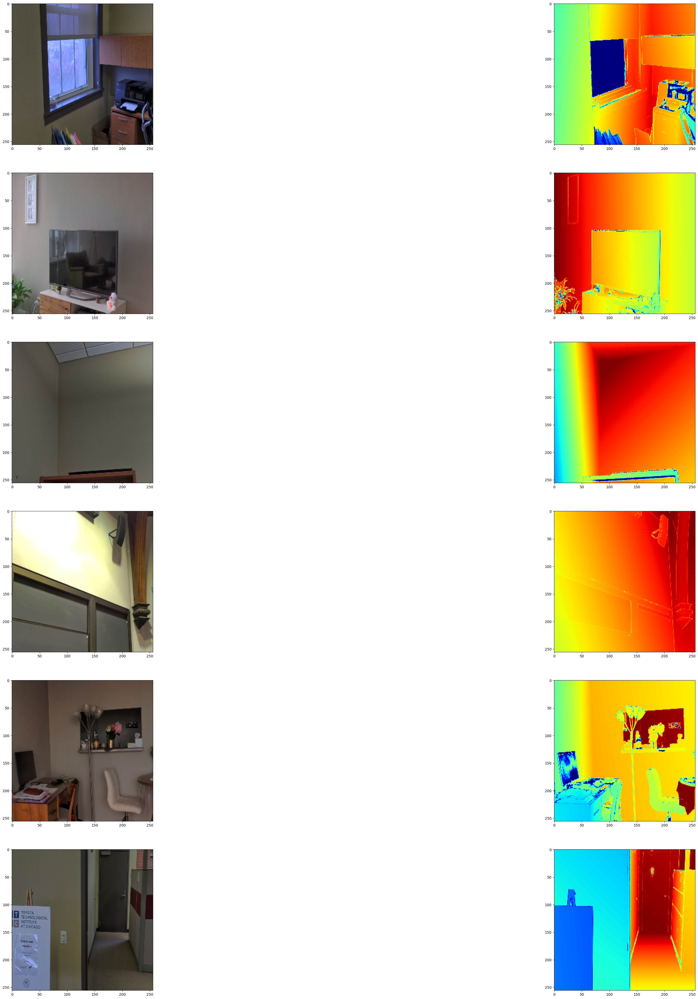

In [ ]:
def visualize_depth_map(samples, test=False, model=None):
    input, target = samples
    cmap = plt.cm.jet
    cmap.set_bad(color="black")

    if test:
        pred = model.predict(input)
        fig, ax = plt.subplots(6, 3, figsize=(50, 50))
        for i in range(6):
            ax[i, 0].imshow((input[i].squeeze()))
            ax[i, 1].imshow((target[i].squeeze()), cmap=cmap)
            ax[i, 2].imshow((pred[i].squeeze()), cmap=cmap)

    else:
        fig, ax = plt.subplots(6, 2, figsize=(50, 50))
        for i in range(6):
            ax[i, 0].imshow((input[i].squeeze()))
            ax[i, 1].imshow((target[i].squeeze()), cmap=cmap)


visualize_samples = next(
    iter(DataGenerator(df, batch_size = 6, size = (height, width)))
)
visualize_depth_map(visualize_samples)

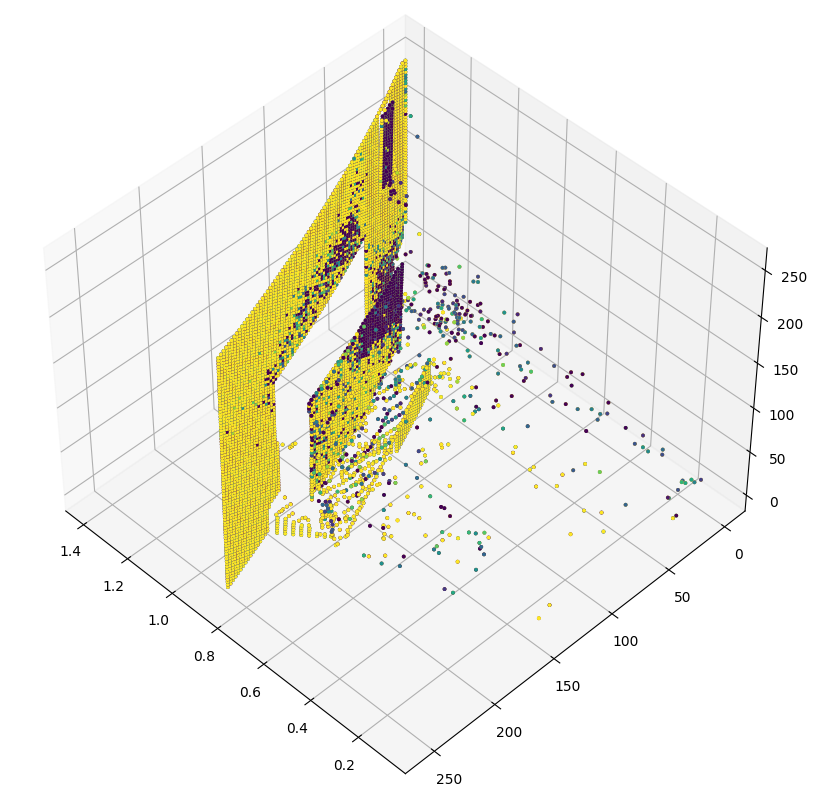

In [ ]:
depth_vis = np.flipud(visualize_samples[1][1].squeeze())  # target
img_vis = np.flipud(visualize_samples[0][1].squeeze())  # input

fig = plt.figure(figsize=(15, 10))
ax = plt.axes(projection="3d")

STEP = 3
for x in range(0, img_vis.shape[0], STEP):
    for y in range(0, img_vis.shape[1], STEP):
        ax.scatter(
            [depth_vis[x, y]] * 3,
            [y] * 3,
            [x] * 3,
            c=tuple(img_vis[x, y, :3] / 255),
            s=3,
        )
    ax.view_init(45, 135)

##**Building a UNET Model**

In [ ]:
class DownSampleBlock(layers.Layer):
    def __init__(self, filters, kernel_size = (3, 3), strides = 1, padding = "same",**kwargs):
        super().__init__(**kwargs)
        self.convA = layers.Conv2D(filters, kernel_size, strides, padding)
        self.convB = layers.Conv2D(filters, kernel_size, strides, padding)
        self.reluA = layers.LeakyReLU(alpha = 0.2)
        self.reluB = layers.LeakyReLU(alpha = 0.2)
        self.bnormA = layers.BatchNormalization()
        self.bnormB = layers.BatchNormalization()
        self.pool = layers.MaxPooling2D((2, 2), (2, 2))


    def call(self, input_shape):
        b = self.convA(input_shape)
        x = self.bnormA(b)
        x = self.reluA(x)


        x = self.convB(x)
        x = self.bnormB(x)
        x = self.reluB(x)


        x += b
        p = self.pool(x)

        return x, p



class UpSampleBlock(layers.Layer):
    def __init__(self, filters, kernel_size = (3, 3), strides = 1, padding = "same", **kwargs):
        super().__init__(**kwargs)
        self.us = layers.UpSampling2D((2, 2))
        self.convA = layers.Conv2D(filters, kernel_size, strides, padding)
        self.convB = layers.Conv2D(filters, kernel_size, strides, padding)
        self.reluA = layers.LeakyReLU(alpha = 0.2)
        self.reluB = layers.LeakyReLU(alpha = 0.2)
        self.bnormA = layers.BatchNormalization()
        self.bnormB = layers.BatchNormalization()
        self.concat = layers.Concatenate()


    def call(self, x, skip):
        x = self.us(x)
        concat = self.concat([x, skip])
        x = self.convA(concat)
        x = self.bnormA(x)
        x = self.reluA(x)

        x = self.convB(x)
        x = self.bnormB(x)
        x = self.reluB(x)

        return x



class BottleNeckBlock(layers.Layer):
    def __init__(self, filters, kernel_size = (3, 3), strides = 1, padding  = "same", **kwargs):
        super().__init__(**kwargs)
        self.convA = layers.Conv2D(filters, kernel_size, strides, padding)
        self.convB = layers.Conv2D(filters, kernel_size, strides, padding)
        self.reluA = layers.LeakyReLU(alpha = 0.2)
        self.reluB = layers.LeakyReLU(alpha = 0.2)


    def call(self, x):
        x = self.convA(x)
        x = self.reluA(x)

        x = self.convB(x)
        x = self.reluB(x)

        return x

##**Defining the loss**

In [ ]:
class DepthEstimationModel(tf.keras.Model):
    def __init__(self):
        super().__init__()
        self.ssim_loss_weight = 0.85
        self.l1_loss_weight = 0.1
        self.edge_loss_weight = 0.9
        self.loss_metric = tf.keras.metrics.Mean(name="loss")
        f = [16, 32, 64, 128, 256]
        self.downsample_block = [
            DownSampleBlock(f[0]),
            DownSampleBlock(f[1]),
            DownSampleBlock(f[2]),
            DownSampleBlock(f[3]),
        ]
        self.bottleneck_block = BottleNeckBlock(f[4])
        self.upsample_block = [
            UpSampleBlock(f[3]),
            UpSampleBlock(f[2]),
            UpSampleBlock(f[1]),
            UpSampleBlock(f[0]),
        ]
        self.conv_layer = layers.Conv2D(1, (1, 1), padding="same", activation="tanh")

    def calculate_loss(self, target, pred):
        # Edges
        dy_true, dx_true = tf.image.image_gradients(target)
        dy_pred, dx_pred = tf.image.image_gradients(pred)
        weights_x = tf.exp(tf.reduce_mean(tf.abs(dx_true)))
        weights_y = tf.exp(tf.reduce_mean(tf.abs(dy_true)))

        # Depth smoothness
        smoothness_x = dx_pred * weights_x
        smoothness_y = dy_pred * weights_y

        depth_smoothness_loss = tf.reduce_mean(abs(smoothness_x)) + tf.reduce_mean(
            abs(smoothness_y)
        )

        # Structural similarity (SSIM) index
        ssim_loss = tf.reduce_mean(
            1
            - tf.image.ssim(
                target, pred, max_val = width, filter_size=7, k1=0.01 ** 2, k2=0.03 ** 2
            )
        )
        # Point-wise depth
        l1_loss = tf.reduce_mean(tf.abs(target - pred))

        loss = (
            (self.ssim_loss_weight * ssim_loss)
            + (self.l1_loss_weight * l1_loss)
            + (self.edge_loss_weight * depth_smoothness_loss)
        )

        return loss

    @property
    def metrics(self):
        return [self.loss_metric]

    def train_step(self, batch_data):
        input, target = batch_data
        with tf.GradientTape() as tape:
            pred = self(input, training=True)
            loss = self.calculate_loss(target, pred)

        gradients = tape.gradient(loss, self.trainable_variables)
        self.optimizer.apply_gradients(zip(gradients, self.trainable_variables))
        self.loss_metric.update_state(loss)
        return {
            "loss": self.loss_metric.result(),
        }

    def test_step(self, batch_data):
        input, target = batch_data

        pred = self(input, training=False)
        loss = self.calculate_loss(target, pred)

        self.loss_metric.update_state(loss)
        return {
            "loss": self.loss_metric.result(),
        }

    def call(self, x):
        c1, p1 = self.downsample_block[0](x)
        c2, p2 = self.downsample_block[1](p1)
        c3, p3 = self.downsample_block[2](p2)
        c4, p4 = self.downsample_block[3](p3)

        bn = self.bottleneck_block(p4)

        u1 = self.upsample_block[0](bn, c4)
        u2 = self.upsample_block[1](u1, c3)
        u3 = self.upsample_block[2](u2, c2)
        u4 = self.upsample_block[3](u3, c1)

        return self.conv_layer(u4)

In [ ]:
model = DepthEstimationModel()

In [ ]:
optimizer = keras.optimizers.Adam(
    learning_rate = learning_rate,
    amsgrad = False)

model.compile(optimizer = optimizer)

train_dataset = DataGenerator(
    df = df[:260].reset_index(drop = True), batch_size = batch_size, size = (height, width))

valid_dataset = DataGenerator(
    df = df[260:].reset_index(drop = True), batch_size = batch_size, size = (height, width), shuffle = False)


model.fit(
    train_dataset,
    validation_data = valid_dataset,
    epochs = epochs)

Epoch 1/30
9/9 [==============================] - 20s 1s/step - loss: 0.6592 - val_loss: 0.5058
Epoch 2/30
9/9 [==============================] - 20s 3s/step - loss: 0.4177 - val_loss: 0.3515                                                                                                                                                                      
Epoch 3/30
9/9 [==============================] - 21s 3s/step - loss: 0.3044 - val_loss: 0.3172                                                                                                                                                                      
Epoch 4/30
9/9 [==============================] - 22s 3s/step - loss: 0.2746 - val_loss: 0.2899                                                                                                                                                                      
Epoch 5/30
9/9 [==============================] - 21s 3s/step - loss: 0.2647 - val_loss: 0.2738                       

##**Model Prediction**

1/1 [==============================] - 0s 23ms/step


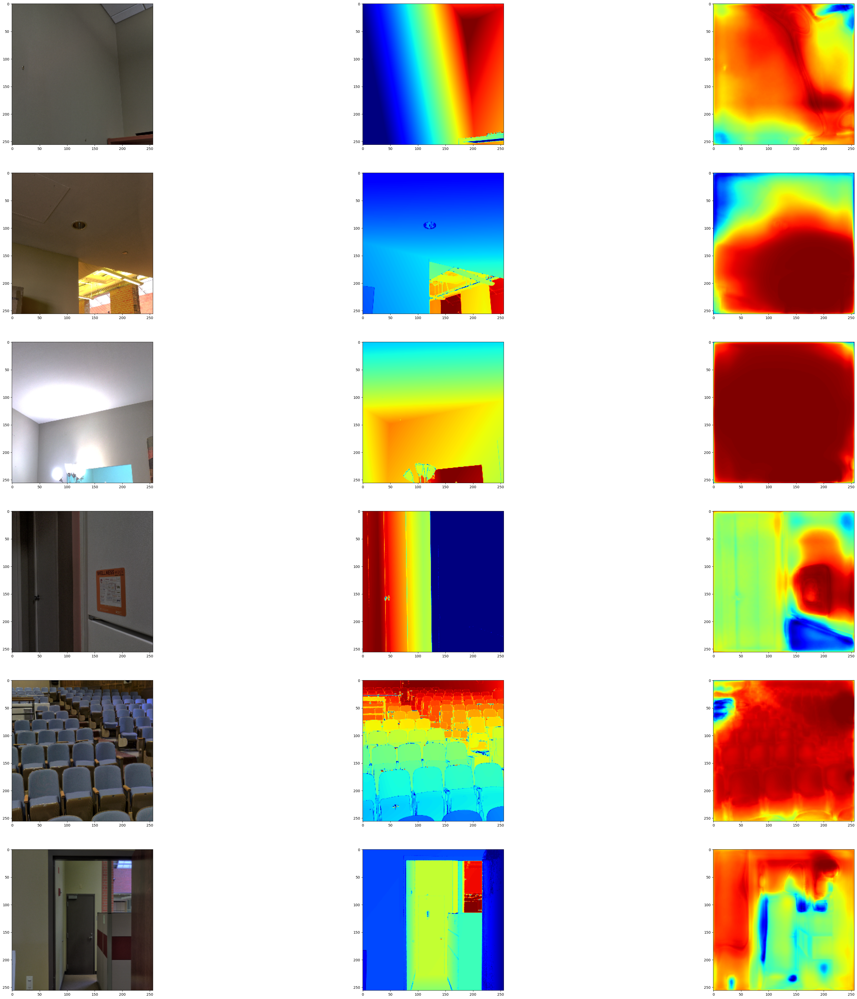

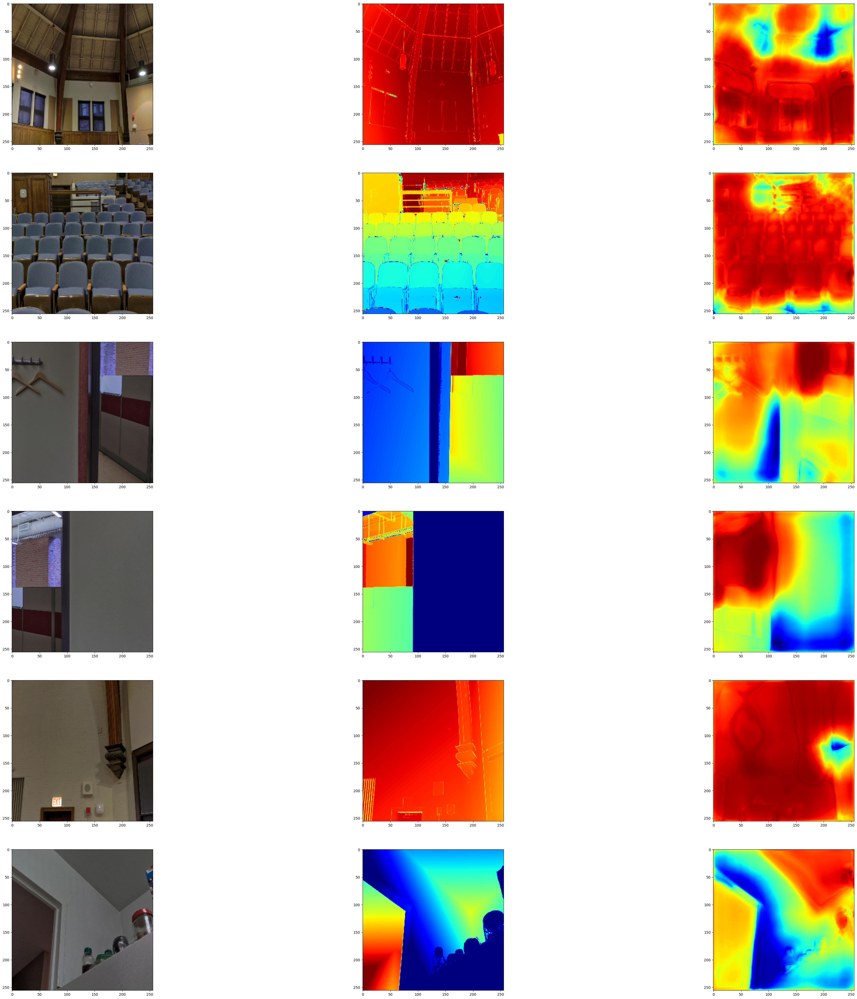

In [ ]:
test_dataset = next(iter(DataGenerator(
            df = df[265:].reset_index(drop="true"), batch_size=6, size = (height, width))))

visualize_depth_map(test_dataset, test=True, model=model)


test_dataset = next(iter(DataGenerator(
            df = df[300:].reset_index(drop="true"), batch_size=6, size = (height, width))))

visualize_depth_map(test_dataset, test=True, model=model)

##**Possible improvements**
1. You can improve this model by replacing the encoding part of the U-Net with a pretrained DenseNet or ResNet.
2. Loss functions play an important role in solving this problem. Tuning the loss functions may yield significant improvement.